In [17]:
import collections

import numpy as np
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (1.25*16, 1.25*9)
sns.set_style('darkgrid')

from scrape_user_stats import safe_json_load

In [2]:
def flatten_dict(d, parent_key='', sep='_'):
    items = []
    for k, v in d.items():
        new_key = parent_key + sep + k if parent_key else k
        if isinstance(v, collections.MutableMapping):
            items.extend(flatten_dict(v, new_key, sep=sep).items())
        else:
            items.append((new_key, v))
    #return items
    return dict(items)
    #return {tuple(k.split(sep)): v for k, v in dict(items).items()}

def from_nested_dict(d, **kwds):    
    return pd.DataFrame.from_dict(flatten_dict(d), **kwds)

In [3]:
users = pd.DataFrame.from_dict(safe_json_load('users.json'), orient='index')
users.date_joined = pd.to_datetime(users['date_joined'])

In [32]:
stats = pd.DataFrame.from_dict(safe_json_load('stats.json'), orient='index')

In [33]:
ach = stats['achievements'].apply(lambda d: pd.Series(d)).fillna(0)
auth = stats['authored'].fillna(0)

In [34]:
comms = stats['comments'].apply(lambda d: pd.Series(d) if d is not None else pd.Series({'comments': 0, 'questions_commented': 0}))

In [35]:
preds = stats['predictions'].apply(lambda d: pd.Series(d))

In [40]:
stats = preds.join([comms, ach, auth])

In [41]:
stats['date_joined'] = users.loc[stats.index, 'date_joined']

In [42]:
stats['level'] = users.loc[stats.index, 'level']

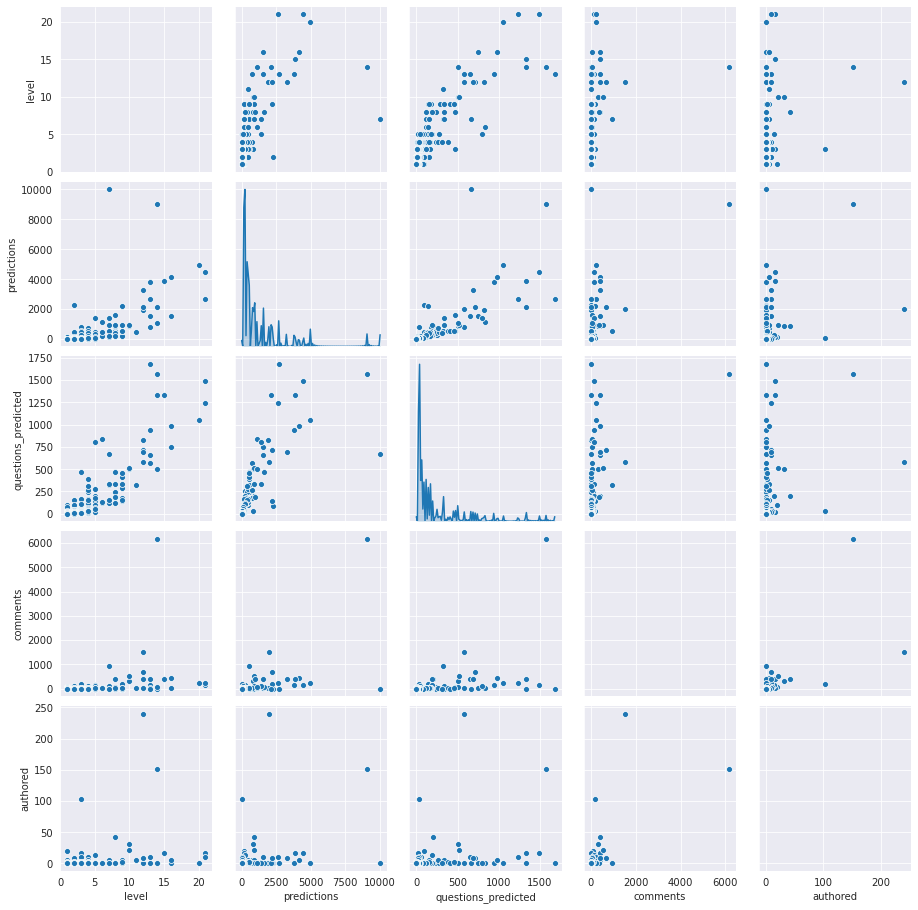

In [46]:
#sns.pairplot(data=stats, vars=['level', 'predictions', 'questions_predicted', 'comments', 'authored'], diag_kind='kde')

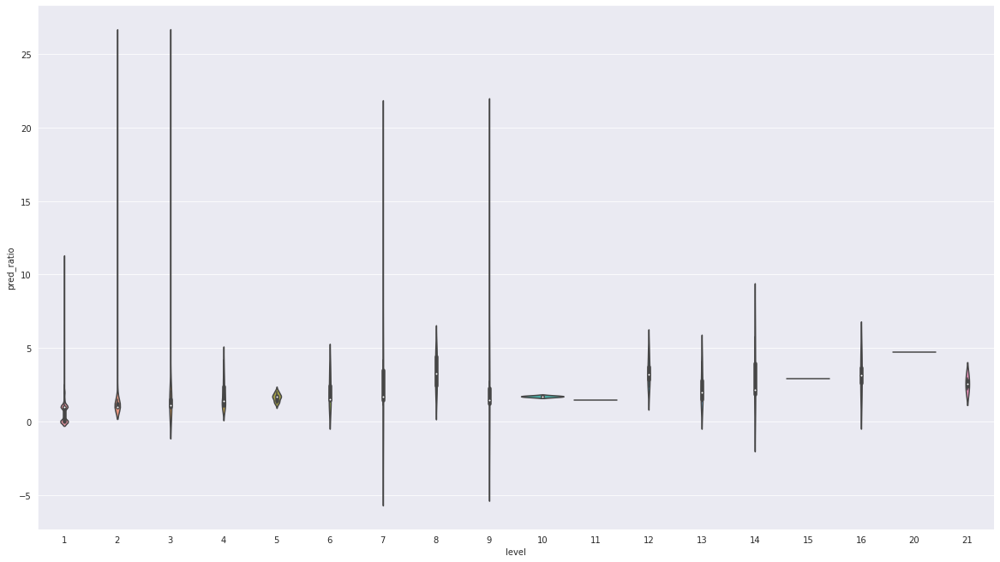

In [57]:
stats['pred_ratio'] = stats.apply(lambda row: row.predictions / row.questions_predicted if row.questions_predicted !=0 else 0, axis=1)
sns.violinplot(data=stats, x='level', y='pred_ratio')

[]

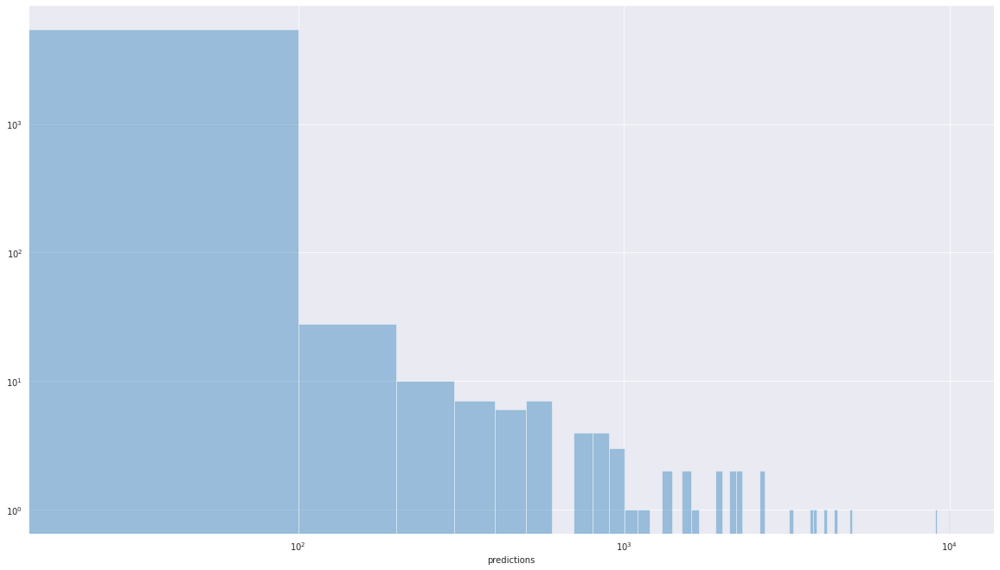

In [73]:
sns.distplot(stats['predictions'], kde=False, bins = 'stone') #list(range(10)) + list(range(10, 100, 10)) + list(range(100, 1000, 100)) + list(range(1000, 10000, 1000)))
plt.loglog()
#plt.yscale('log')

In [86]:
#np.cumsum(["{:.2f}".format(100 * stats.predictions.apply(lambda x: x==y).sum() / stats.shape[0]) for y in range(11)])
#["{:.2f}".format(100*x) for x in np.cumsum([stats.predictions.apply(lambda x: x==y).sum() / stats.shape[0] for y in range(82)])]
# 40% of users have made no predictions
# < 8% of users have made more than 10
# < 4% of users have made more than 20
# I'm currently among the top 2% at 81 predictions

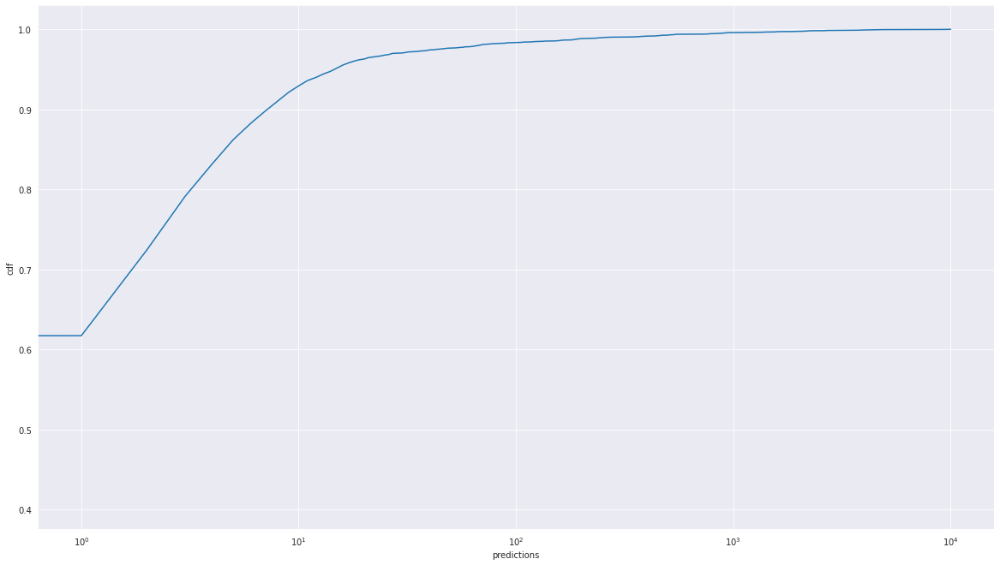

In [115]:
sns.lineplot(data=stats.groupby('predictions').count().iloc[:,0].rename('cdf').cumsum().apply(lambda x: x/stats.shape[0]).reset_index(), x='predictions', y='cdf')
plt.xscale('log')